In [95]:
import geopandas as gpd
from pathlib import Path
from shapely.geometry import Polygon
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import numpy as np
import json


In [2]:
PREPROCESSED_DATA_PATH = Path("~/Library/Mobile Documents/com~apple~CloudDocs/MIT/6.C35")
PREPROCESSED_DATA_PATH

PosixPath('~/Library/Mobile Documents/com~apple~CloudDocs/MIT/6.C35')

In [7]:
parcels_within_station_buffer = gpd.read_file(PREPROCESSED_DATA_PATH / 'station_only_parcels.geojson')

#### Create Dummy Parcel Data

In [58]:
brookline_milton_parcels = parcels_within_station_buffer[(parcels_within_station_buffer["municipality"] == 'Brookline') | (parcels_within_station_buffer["municipality"] ==  "Milton")]

In [ ]:
multifamily
104: duplex
105: triplex
109: multiple buildings 1 lot
111, 112: apt up to 30 units
113, 114: apt over 30 units
115: coop apt
rest is other multifamily

In [96]:
brookline_milton_parcels['isZonedAsSF'] = np.random.choice([True, False], len(brookline_milton_parcels))
brookline_milton_parcels['isZonedAsComm'] = np.random.choice([True, False], len(brookline_milton_parcels))
brookline_milton_parcels['isZonedAsMulti'] = np.random.choice([True, False], len(brookline_milton_parcels))

brookline_milton_parcels['isUsedAsSF'] = np.random.choice([True, False], len(brookline_milton_parcels))
brookline_milton_parcels['isUsedAsComm'] = np.random.choice([True, False], len(brookline_milton_parcels))
brookline_milton_parcels['isUsedAsMulti'] = np.random.choice([True, False], len(brookline_milton_parcels))

brookline_milton_parcels['isUsedAsDuplex'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 104: duplex
brookline_milton_parcels['isUsedAsTriplex'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 105: triplex
brookline_milton_parcels['isUsedAsMultiBuildings1Lot'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 109: multiple buildings 1 lot
brookline_milton_parcels['isUsedAsAptUpTo30Units'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 111, 112: apt up to 30 units
brookline_milton_parcels['isUsedAsAptOver30Units'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 113, 114: apt over 30 units
brookline_milton_parcels['isUsedAsCoopApt'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 115: coop apt
brookline_milton_parcels['isUsedAsOtherMultifamily'] = np.random.choice([True, False], len(brookline_milton_parcels)) #everything else that's multifamily


brookline_milton_parcels['mustUpzone'] = brookline_milton_parcels.apply(lambda row: True if row['isZonedAsSF'] else False, axis=1)
brookline_milton_parcels['willChange'] = brookline_milton_parcels.apply(lambda row: True if (row['isZonedAsSF'] and row['isUsedAsSF']) else False, axis=1)

brookline_milton_parcels['numUnits'] = np.random.choice(130, len(brookline_milton_parcels), replace=True)



/Users/ameliabaum/miniforge3/envs/6.C85-final-proj/lib/python3.9/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [97]:
brookline_milton_parcels['zone_id'] = brookline_milton_parcels['zone_id'].apply(json.dumps)
brookline_milton_parcels['routes'] = brookline_milton_parcels['routes'].apply(json.dumps)
brookline_milton_parcels['route_colors'] = brookline_milton_parcels['route_colors'].apply(json.dumps)

In [100]:
brookline_milton_parcels.to_file("brookline_milton_parcels_dummies.geojson", driver='GeoJSON')

#### Create Dummy Stop Zone Data

In [103]:

def percentage_true(series):
    return (series.sum() / len(series)) * 100



brookline_milton_parcels['isUsedAsDuplex'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 104: duplex
brookline_milton_parcels['isUsedAsTriplex'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 105: triplex
brookline_milton_parcels['isUsedAsMultiBuildings1Lot'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 109: multiple buildings 1 lot
brookline_milton_parcels['isUsedAsAptUpTo30Units'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 111, 112: apt up to 30 units
brookline_milton_parcels['isUsedAsAptOver30Units'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 113, 114: apt over 30 units
brookline_milton_parcels['isUsedAsCoopApt'] = np.random.choice([True, False], len(brookline_milton_parcels)) # 115: coop apt
brookline_milton_parcels['isUsedAsOtherMultifamily'] = np.random.choice([True, False], len(brookline_milton_parcels)) #everything else that's multifamily

stop_zone_data = brookline_milton_parcels.groupby('stop_name').agg({
    'municipality': 'first',
    'isZonedAsSF': percentage_true,                          
    'isZonedAsComm': percentage_true,
    'isZonedAsMulti': percentage_true,    
    'isUsedAsSF': percentage_true,
    'isUsedAsComm': percentage_true,
    'isUsedAsMulti': percentage_true,
    'isUsedAsDuplex': percentage_true,
    'isUsedAsTriplex': percentage_true,
    'isUsedAsMultiBuildings1Lot': percentage_true,
    'isUsedAsAptUpTo30Units': percentage_true,
    'isUsedAsAptOver30Units': percentage_true,
    'isUsedAsCoopApt': percentage_true,
    'isUsedAsOtherMultifamily': percentage_true,
    'mustUpzone': percentage_true,
    'willChange': percentage_true,
    'numUnits': 'sum'
}).reset_index()

stop_zone_data.rename(columns={
    'isZonedAsSF': 'pctZonedAsSF',                          
    'isZonedAsComm': 'pctZonedAsComm',
    'isZonedAsMulti': 'pctZonedAsMulti',    
    'isUsedAsSF': 'pctUsedAsSF',
    'isUsedAsComm': 'pctUsedAsComm',
    'isUsedAsMulti': 'pctUsedAsMulti',
    'isUsedAsDuplex': 'pctUsedAsDuplex',
    'isUsedAsTriplex': 'pctUsedAsTriplex',
    'isUsedAsMultiBuildings1Lot': 'pctUsedAsMultiBuildings1Lot',
    'isUsedAsAptUpTo30Units': 'pctUsedAsAptUpTo30Units',
    'isUsedAsAptOver30Units': 'pctUsedAsAptOver30Units',
    'isUsedAsCoopApt': 'pctUsedAsCoopApt',
    'isUsedAsOtherMultifamily': 'pctUsedAsOtherMultifamily',
    'mustUpzone': 'pctMustUpzone',
    'willChange': 'pctWillChange'
}, inplace=True)

n = len(stop_zone_data)
stop_zone_data['pctNhWhite'] = np.random.rand(n)*100
stop_zone_data['pctNhBlack'] = np.random.rand(n)*100
stop_zone_data['pctNhAsian'] = np.random.rand(n)*100
stop_zone_data['pctHispanic'] = np.random.rand(n)*100
stop_zone_data['medianHHIncome2022'] = np.random.uniform(10000, 500000, n).astype(int)
stop_zone_data['pctFemale'] = np.random.rand(n)*100
stop_zone_data['pctMale'] = np.random.rand(n)*100
stop_zone_data['pct0CarHouseholds'] = np.random.rand(n)*100
stop_zone_data['medianHomeValue'] = np.random.uniform(100000, 2000000, n).astype(int)
stop_zone_data['pctTransitCommuters'] = np.random.rand(n)*100



# stop_zone_data.to_file("brookline_milton_stop_zone_data_dummies.geojson", driver='GeoJSON')


/Users/ameliabaum/miniforge3/envs/6.C85-final-proj/lib/python3.9/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [110]:
stop_zone_data.columns

Index(['stop_name', 'municipality', 'pctZonedAsSF', 'pctZonedAsComm',
       'pctZonedAsMulti', 'pctUsedAsSF', 'pctUsedAsComm', 'pctUsedAsMulti',
       'pctUsedAsDuplex', 'pctUsedAsTriplex', 'pctUsedAsMultiBuildings1Lot',
       'pctUsedAsAptUpTo30Units', 'pctUsedAsAptOver30Units',
       'pctUsedAsCoopApt', 'pctUsedAsOtherMultifamily', 'pctMustUpzone',
       'pctWillChange', 'numUnits', 'pctNhWhite', 'pctNhBlack', 'pctNhAsian',
       'pctHispanic', 'medianHHIncome2022', 'pctFemale', 'pctMale',
       'pct0CarHouseholds', 'medianHomeValue', 'pctTransitCommuters'],
      dtype='object')

In [108]:
stations_with_buffer = gpd.read_file("stations_with_buffer.geojson")
stop_zone_dummy_data_gdf = stations_with_buffer.merge(stop_zone_data, on='stop_name')

stop_zone_dummy_data_gdf['zone_id'] = stop_zone_dummy_data_gdf['zone_id'].apply(json.dumps)
stop_zone_dummy_data_gdf['routes'] = stop_zone_dummy_data_gdf['routes'].apply(json.dumps)
stop_zone_dummy_data_gdf['route_colors'] = stop_zone_dummy_data_gdf['route_colors'].apply(json.dumps)
stop_zone_dummy_data_gdf.to_file("brookline_milton_stop_zone_dummies.geojson", driver='GeoJSON')


In [109]:
foo = gpd.read_file("brookline_milton_stop_zone_dummies.geojson")
foo

,stop_name,zone_id,routes,route_colors,municipality_x,namelsad20,housing20,sq_miles,pop2020,area_acres,...,pctNhBlack,pctNhAsian,pctHispanic,medianHHIncome2022,pctFemale,pctMale,pct0CarHouseholds,medianHomeValue,pctTransitCommuters,geometry
0,Beaconsfield,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""D\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,74.689001,28.218723,80.706673,28432,23.844795,58.852716,10.815490,1068758,57.300661,"POLYGON ((-71.13074 42.33574, -71.13079 42.335..."
1,Brandon Hall,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""C\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,65.842027,86.502312,63.796600,139131,63.970077,26.919678,29.657171,635540,87.756882,"POLYGON ((-71.11900 42.34001, -71.11905 42.339..."
2,Brookline Hills,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""D\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,16.688276,3.100349,44.041723,74214,4.525661,6.350685,86.493891,899828,41.208194,"POLYGON ((-71.11695 42.33132, -71.11700 42.330..."
3,Brookline Village,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""D\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,89.842152,1.468732,97.034100,87847,13.523251,55.137613,21.165522,1223799,65.542720,"POLYGON ((-71.10713 42.33256, -71.10718 42.331..."
4,Capen Street,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""Mattapan Trolley\\\""]\""""","""\""[\\\""#DA291C\\\""]\""""",Milton,Milton,9844.0,13.15,28630.0,8417.78,...,18.240780,69.761391,30.686349,55001,8.629460,50.634989,89.175405,475880,86.976800,"POLYGON ((-71.07749 42.26754, -71.07754 42.266..."
5,Central Avenue,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""Mattapan Trolley\\\""]\""""","""\""[\\\""#DA291C\\\""]\""""",Milton,Milton,9844.0,13.15,28630.0,8417.78,...,99.678063,59.926395,6.289668,237279,60.653828,70.271415,84.077670,429402,68.648542,"POLYGON ((-71.06369 42.26999, -71.06374 42.269..."
6,Coolidge Corner,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""C\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,54.291810,39.281365,89.892753,181077,76.583081,12.979461,98.608838,864867,0.341018,"POLYGON ((-71.11154 42.34212, -71.11159 42.341..."
7,Dean Road,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""C\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,18.299573,58.692527,99.335855,369729,75.171991,34.952975,52.077193,405976,70.606046,"POLYGON ((-71.13227 42.33769, -71.13232 42.336..."
8,Englewood Avenue,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""C\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,34.651260,25.709877,69.996951,21607,44.955042,46.996769,74.292053,865225,85.834090,"POLYGON ((-71.13585 42.33696, -71.13590 42.336..."
9,Fairbanks Street,"""\""[\\\""RapidTransit\\\""]\""""","""\""[\\\""C\\\""]\""""","""\""[\\\""#00843D\\\""]\""""",Brookline,Brookline,27961.0,6.83,63191.0,4371.28,...,93.261208,36.429410,78.989841,183457,16.295031,96.632912,29.141771,1624448,29.902218,"POLYGON ((-71.12139 42.33964, -71.12144 42.338..."


In [83]:
sum(pd.to_numeric(parcels_within_station_buffer['UNITS'], errors='coerce').dropna())

292369.0

In [174]:
selected_columns = ['LOC_ID', 'TOWN_NAME', 'USE_CODE', 'LOCATION', 'CITY', 'ZONING', 'STYLE', 'stop_name', 'geometry', 'LOT_SIZE', 'UNITS']

#these are for brookline, will need to see if they scale https://www.brooklinema.gov/DocumentCenter/View/19956/GIS---Zoning-Map-10CC-11x17pdf
sf_zoning_codes = ['S-40', 'S-25', 'S-15', 'S-10', 'S-7', 'S-4', 'S-0.5P,' 'S-0.75P', 'SC-7', 'SC-10', 'T-6', 'T-5', 'SF', 'S10', 'S40', 'S25', 'S15', 'S7', 'S4']
multifamily_zoning_codes = ['F10', 'M-0.5', 'M5', 'M10', 'M10(CAM)', 'M15', 'M20', 'M25'] #the zoning code says M1.0, M1.5, but the data has it has M10, M15, etc.
commercial_zoning_codes = ['L-0.5', 'L-0.5(CL)', 'L-1.0', 'G-1.0', 'G-(DP)', 'G-1.75(CC)', 'G-1.75(LSH)', 'G-1.75(WS)', 'G-2.0', 'G-2.0(CA)', 'GMR-2.0', 'O-1.0', 
                           'O-2.0(CH)', 'G175(LSH', 'G10', 'G20', 'G175(WS)', 'G175(CC)', 'G(DP)', 'G', 'GU', 'GR','GB', 'GI', 'G RS', 'GC', 'GBD', 'GD', 'G20', 'G175(CC)', 
                           'G175(WS)', 'G175(LSH', 'G10', 'GMR20', 'G(DP)', 'GRA', 'GRB'] 



multifamily_use_codes = [str(num) for num in range(105, 121 + 1)] #TODO: remove parking
commercial_use_codes = [str(num) for num in range(300, 399 + 1)]



def get_pct_sf_zoning(community_df: pd.DataFrame) -> float:
    # “Multi-family housing” means a building with 3 or more residential dwelling units or 
    # 2 or more buildings on the same lot with more than 1 residential dwelling unit in each building.
    # Based on this I am including duplex zoning in the designation of area that would need to be upzoned
    
    pct_sfzoning_parcels = len(community_df[community_df["ZONING"].isin(sf_zoning_codes)])/len(community_df) # TODO: review zoning codes and make sure this is the only one
    return round(pct_sfzoning_parcels*100, 2)


def get_pct_multifamily_zoning(community_df: pd.DataFrame) -> float:

    pct_multifamily_zoning_parcels = len(community_df[(community_df["ZONING"].isin(multifamily_zoning_codes))])/len(community_df)
    return round(pct_multifamily_zoning_parcels*100, 2)

def get_pct_commercial_zoning(community_df: pd.DataFrame) -> float:

    pct_commercial_zoning_parcels = len(community_df[(community_df["ZONING"].isin(commercial_zoning_codes))])/len(community_df)
    return round(pct_commercial_zoning_parcels*100, 2)


def get_pct_multifamily_usage(community_df: pd.DataFrame) -> float:

    pct_multifamily_use_parcels = len(community_df[(community_df["USE_CODE"].isin(multifamily_use_codes))])/len(community_df)
    return round(pct_multifamily_use_parcels*100, 2)

def get_pct_commercial_usage(community_df: pd.DataFrame) -> float:

    pct_commercial_usage_parcels = len(community_df[(community_df["USE_CODE"].isin(commercial_use_codes))])/len(community_df)
    return round(pct_commercial_usage_parcels*100, 2)

def get_pct_sf_use(community_df: pd.DataFrame) -> float:
    #TODO: include 104 for 2 family dwelling?
    pct_sfuse_parcels = len(community_df[community_df["USE_CODE"] == '101'])/len(community_df) 
    return round(pct_sfuse_parcels*100, 2)


def get_current_density(parcels_within_station_buffer):
    # MBTA CA requires 15 units per acre
    # density = number of units/total developable parcel area
    total_units = sum(pd.to_numeric(parcels_within_station_buffer['UNITS'], errors='coerce').dropna())
    total_land_area = sum(pd.to_numeric(parcels_within_station_buffer['LOT_SIZE'], errors='coerce').dropna())

    return total_units/total_land_area
    



def get_median_lot_size():
    #TODO: These seem like acres.
    return pd.to_numeric(parcels_within_station_buffer['LOT_SIZE']).median()


# def get_median_property_value():
    

    

In [187]:
# def visualize_land_use_distribution_of_station_area()
    

def visualize_zoning_distribution_of_station_area(community_df):
    
    sns.set_style('darkgrid')
    df_long = pd.melt(community_df, id_vars='mbta_stop', var_name='Category', value_name='Usage')

    # Create the stacked bar chart using Seaborn
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df_long, x='mbta_stop', y='Usage', hue='Category', palette='pastel', edgecolor='grey')

    # Add labels and title
    plt.xlabel('mbta_stop')
    plt.ylabel('Percentage')
    plt.title('Parcel Usage Breakdown by T Stop: Brookline, MA')

    # Show plot
    plt.xticks(rotation=45)
    plt.legend(title='Category')
    plt.tight_layout()
    plt.show()


In [181]:
parcel_usage = []
for stop in parcels_within_station_buffer[parcels_within_station_buffer['TOWN_NAME'] == 'Brookline']["stop_name"].unique():
    stop_df = parcels_within_station_buffer[parcels_within_station_buffer["stop_name"] == stop]
    parcel_usage.append({'mbta_stop': stop, 
     "% SF usage": get_pct_sf_use(stop_df), 
     "% multifamily usage": get_pct_multifamily_usage(stop_df),
     "% commercial usage": get_pct_commercial_usage(stop_df)})

    # print('stop: ', stop, "% SF zoning", get_pct_sf_zoning(stop_df), "% multifamily", get_pct_multifamily_zoning(stop_df))
    # print('stop: ', stop, "zoning types: ", stop_df["ZONING"].unique())
# parcel_usage
usage_by_stop_brookline = pd.DataFrame(parcel_usage)


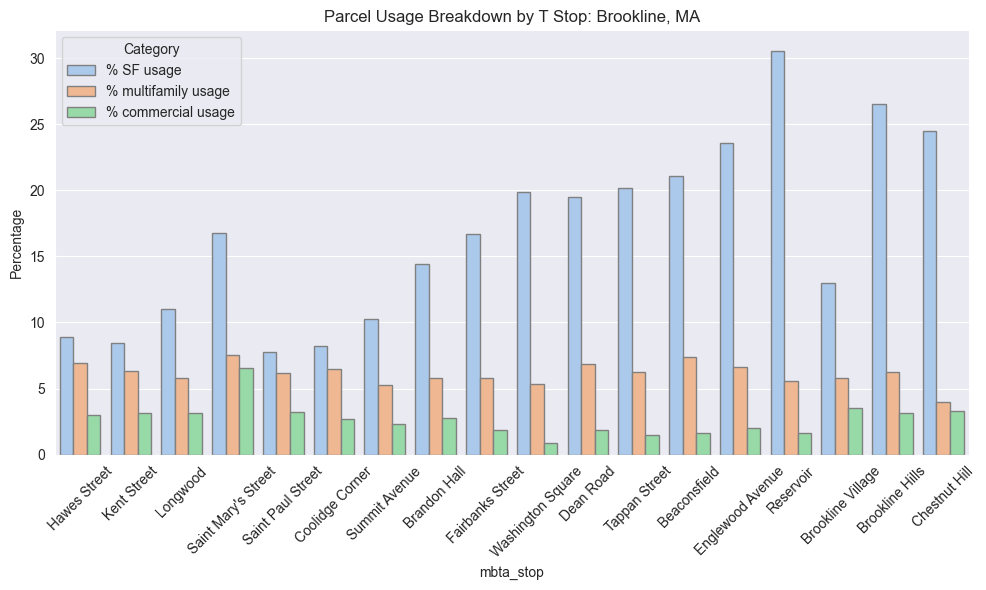

In [188]:

visualize_zoning_distribution_of_station_area(usage_by_stop_brookline)

### Coolidge Corner Stats

In [160]:
parcels_within_station_buffer_brookline_cc = parcels_within_station_buffer[parcels_within_station_buffer["stop_name"] == 'Coolidge Corner']

parcels_within_station_buffer_brookline_cc = parcels_within_station_buffer_brookline_cc[selected_columns]

print('% sf zoning', get_pct_sf_zoning(parcels_within_station_buffer_brookline_cc))
print('% sf use', get_pct_sf_use(parcels_within_station_buffer_brookline_cc))
print('% multifamily zoning', get_pct_multifamily_zoning(parcels_within_station_buffer_brookline_cc))
print('% commercial zoning', get_pct_commercial_zoning(parcels_within_station_buffer_brookline_cc))

print('current housing density (units/acre)', get_current_density(parcels_within_station_buffer_brookline_cc))

% sf zoning 13.57
% sf use 8.19
% multifamily zoning 10.87
% commercial zoning 1.15
current housing density (units/acre) 45.104982502916144


#### Washington Square Stats

In [162]:
parcels_within_station_buffer_brookline_ws = parcels_within_station_buffer[parcels_within_station_buffer["stop_name"] == 'Washington Square']
parcels_within_station_buffer_brookline_ws = parcels_within_station_buffer_brookline_ws[selected_columns]


print('% sf zoning', get_pct_sf_zoning(parcels_within_station_buffer_brookline_ws))
print('% sf use', get_pct_sf_use(parcels_within_station_buffer_brookline_ws))
print('% multifamily zoning', get_pct_multifamily_zoning(parcels_within_station_buffer_brookline_ws))

print('% commercial zoning', get_pct_commercial_zoning(parcels_within_station_buffer_brookline_ws))

print('current housing density (units/acre)', get_current_density(parcels_within_station_buffer_brookline_ws))



% sf zoning 25.09
% sf use 19.9
% multifamily zoning 15.61
% commercial zoning 1.23
current housing density (units/acre) 24.400417101147106


In [191]:
brookline_cc_ws_df = parcels_within_station_buffer[parcels_within_station_buffer["stop_name"].isin(["Coolidge Corner", "Washington Square"])]
brookline_cc_ws_df[brookline_cc_ws_df["ZONING"].isin(sf_zoning_codes)].explore()

In [193]:
# brookline_cc_ws_df['geometry'] = brookline_cc_ws_df['geometry'].style.set_facecolor('green')

brookline_cc_ws_df[brookline_cc_ws_df["USE_CODE"] == '101'].explore(color ='green')